In [6]:
# from .generator import GenStage

import numpy as np
import matplotlib.pyplot as plt
from utils import *

def gauss_clusters(
    n_clusters=10, dim=10, pts_cluster=100, random_state=None, cov=1, stepsize=1,
):

    if random_state is None:
        rng = np.random.RandomState()
    else:
        rng = random_state

    n = n_clusters * pts_cluster

    s = stepsize / np.sqrt(dim)
    means = np.linspace(np.zeros(dim), n_clusters * s, num=n_clusters, endpoint=False)
    cshift_mask = np.zeros(n_clusters, dtype=bool)
    cshift_mask[15] = True
    cov = np.eye(dim) * cov

    clusters = np.array(
        [rng.multivariate_normal(m, cov, size=(pts_cluster)) for m in means]
    )

    X = np.reshape(clusters, (-1, dim))

    y = np.repeat(np.arange(n_clusters), pts_cluster)
    return X, y


# class GaussLine(GenStage):
#     def __init__(
#         self,
#         path,
#         dataname="data.npy",
#         labelname="labels.npy",
#         descname="descr.md",
#         random_state=None,
#         n_clusters=20,
#         dim=50,
#         pts_cluster=1000,
#         cluster_dist=6,
#         cmap="copper",
#     ):
#         super().__init__(
#             path, dataname=dataname, labelname=labelname, random_state=random_state
#         )
#         self.n_clusters = n_clusters
#         self.dim = dim
#         self.pts_cluster = pts_cluster
#         self.cluster_dist = cluster_dist
#         self.cmap = cmap

#     def transform(self):
#         self.data_, self.labels = gauss_clusters(
#             self.n_clusters,
#             self.dim,
#             self.pts_cluster,
#             stepsize=self.cluster_dist,
#             random_state=self.random_state,
#         )

#         # transform the labels to proper rgb colors already so we
#         # don't have to worry about it later
#         self.cmap = plt.get_cmap(self.cmap, lut=self.labels.max() + 1)
#         self.labels_ = self.cmap(self.labels)

#         self.description_ = (
#             "Gaussian clusters shifted along a line.  This dataset is "
#             "simulating developmental data."
#         )

#         return self.data_

In [2]:
n_clusters = 20
dim = 50
pts_cluster = 1000
cluster_dist = 6
random_state = None

data, labels = gauss_clusters(
    n_clusters,
    dim,
    pts_cluster,
    stepsize=cluster_dist,
    random_state=random_state,
)

In [3]:
data.shape, labels.shape

((20000, 50), (20000,))

In [11]:
import umap

In [6]:
reducer = umap.UMAP()
z = reducer.fit_transform(data)
draw_z(z=normalise(z), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>

In [13]:
reducer = umap.UMAP(n_neighbors=1000)
z = reducer.fit_transform(data)
draw_z(z=normalise(z), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>

In [15]:
from sklearn.manifold import SpectralEmbedding

se = SpectralEmbedding()
v = se.fit_transform(data)
draw_z(z=normalise(v), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>

In [14]:
import pacmap

<Figure size 15000x15000 with 0 Axes>

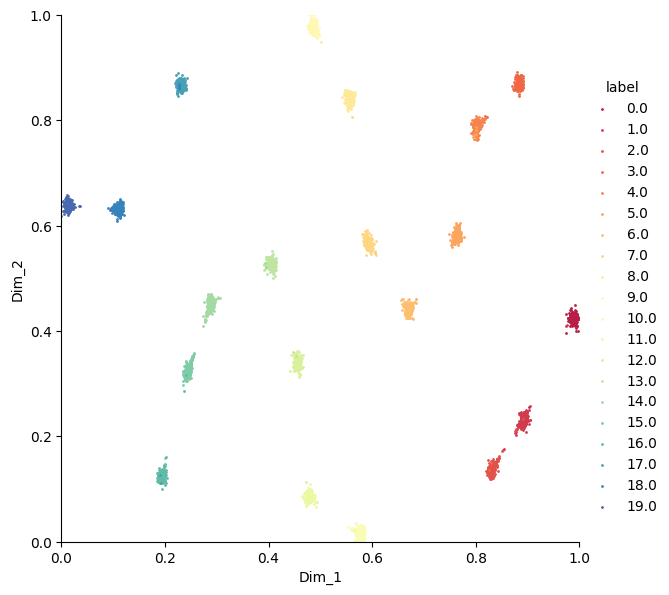

In [7]:
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0)
data_transformed = embedding.fit_transform(data, init="pca")
draw_z(z=normalise(data_transformed), cls=labels, s=1)

In [15]:
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=100, MN_ratio=0.5, FP_ratio=2.0)
data_transformed = embedding.fit_transform(data, init="pca")
draw_z(z=normalise(data_transformed), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>

In [16]:
embedding = pacmap.PaCMAP(n_components=2, n_neighbors=1000, MN_ratio=0.5, FP_ratio=2.0)
data_transformed = embedding.fit_transform(data, init="pca")
draw_z(z=normalise(data_transformed), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>

In [19]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=30)
z = tsne.fit_transform(data)
draw_z(z=normalise(z), cls=labels, s=1)

<Figure size 15000x15000 with 0 Axes>